In [25]:
import numpy as np
import matplotlib.pyplot as plt
from imageio.v3 import imread, imwrite # conda install conda-forge::imageio
import cv2; from mpl_toolkits.mplot3d import Axes3D

def draw_jp_map(texture, dem, height):
    l=256
    size=(l,l)
    z = cv2.resize(dem, size)
    tex = cv2.resize(np.delete(texture, 3, axis=2), size)
    x = y = np.linspace(0, l, l)
    x, y = np.meshgrid(x, y)
    x = np.ravel(x)
    y = np.ravel(y)
    z = np.ravel(z)
    c=np.reshape(tex,(l*l,3))
    for idx, z_ in enumerate(z):
        if z_< height:
          z[idx]=0.0
          c[idx]=[0,0,1]
    fig=plt.figure(figsize=[20,20])
    ax=fig.add_subplot(111,projection='3d')
    ax.scatter3D(x,
             y,
             z,
             s=2,alpha=0.6,
             c=np.reshape(tex,(l*l,3)))
    ax.set_zlim(0,1000);ax.invert_yaxis()

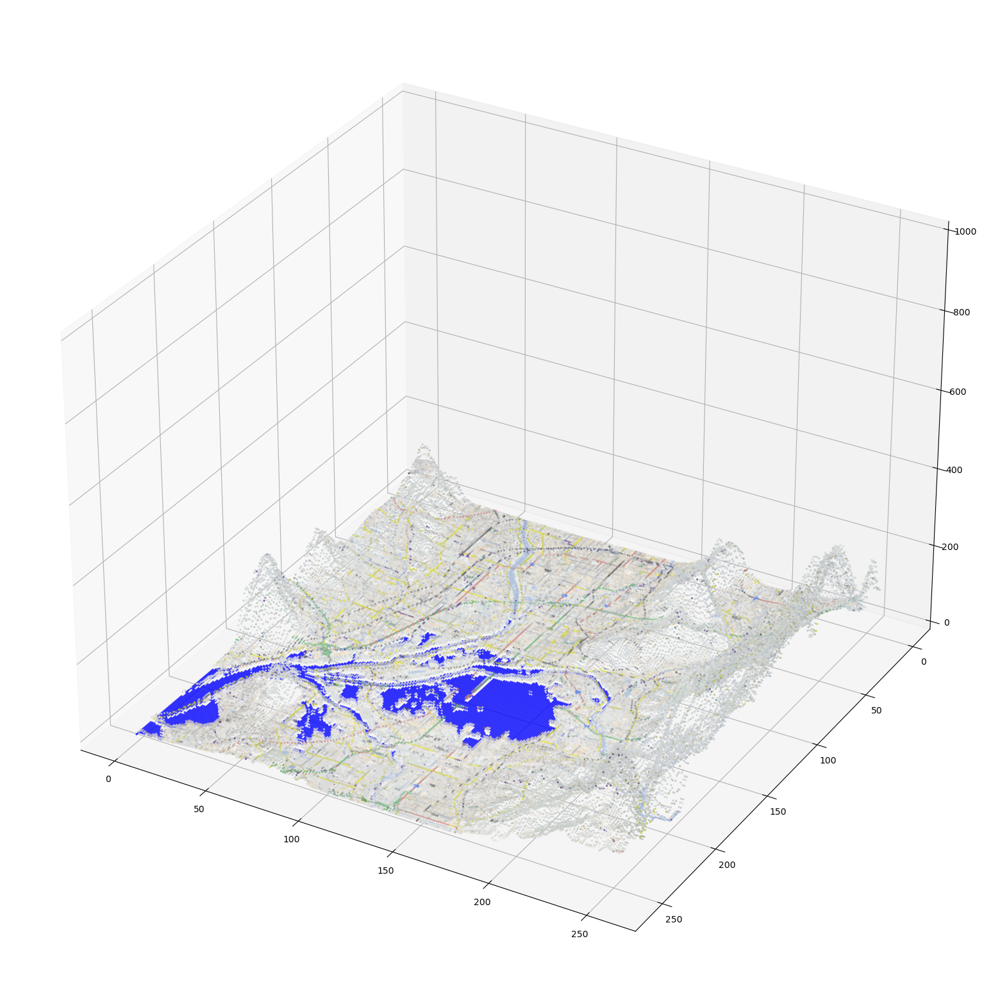

In [26]:
# 地図画像と写真画像(2048, 2048, 4)を読む
texture_map = imread('texture.png')
texture_photo = imread('texture-2.png')
texture = (texture_map*0.7+texture_photo*0.3)/255 # 地図・写真を適当に合成する

# 標高情報（CSVファイル）を読み込む
dem = np.loadtxt('dem.csv', delimiter=',')
dem_size = 257
dem = 100*dem.reshape([dem_size,dem_size])

draw_jp_map(texture, dem, 7)

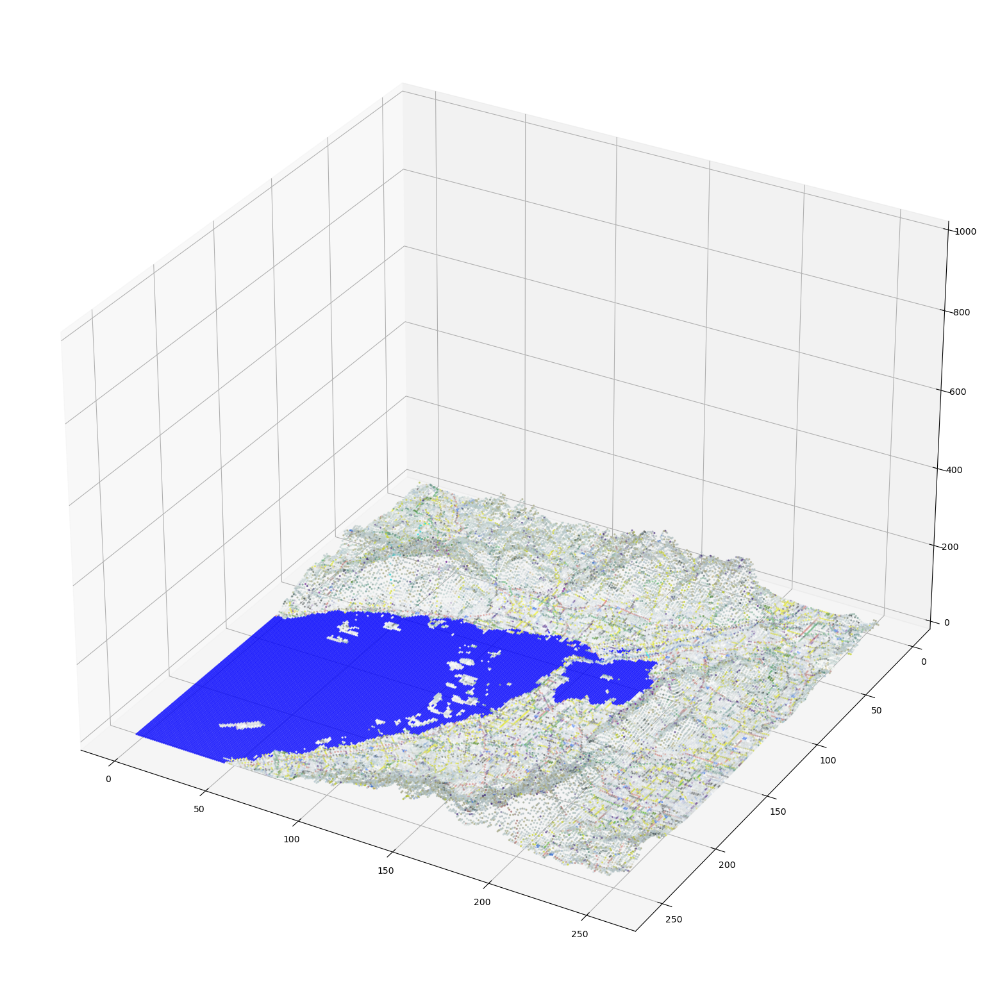

In [30]:
# 地図画像と写真画像(2048, 2048, 4)を読む
texture_map = imread('texture_osaka.png')
texture_photo = imread('texture_osaka-2.png')
texture = (texture_map*0.7+texture_photo*0.3)/255 # 地図・写真を適当に合成する

# 標高情報（CSVファイル）を読み込む
dem = np.loadtxt('dem_osaka.csv', delimiter=',')
dem_size = 257
dem = 100*dem.reshape([dem_size,dem_size])

draw_jp_map(texture, dem, 0.5)

In [34]:
# https://anaconda.org/conda-forge/gdal
# conda install conda-forge::gdal
from osgeo import gdal
gdal.UseExceptions()

# GeoTIFFを読み込み（現在基準で）指定した相対海水面高で地図を描く
def draw_map(file, height):
    ds = gdal.Open(file)
    elevation = ds.ReadAsArray() 
    nrows, ncols = elevation.shape
    x0, dx, dxdy, y0, dydx, dy = ds.GetGeoTransform()
    x1 = x0 + dx * ncols
    y1 = y0 + dy * nrows
    fig=plt.figure(figsize=[200,100])
    plt.imshow(np.clip(elevation, height, height+5),
               cmap='gist_earth', extent=[x0, x1, y1, y0])
    plt.show()

file = 'ETOPO_2022_v1_60s_N90W180_bed.tif'
height = -100
draw_map(file, height)